Необходимо разработать модель, которая определит жанр музыкального альбома по изображению его обложки.

1. Загрузим и ознакомимся с данными
2. Построим бейзлайн - модель, основанную на эмбеддингах изображений, построенную с помощью алгоритма KNN.
3. Построим рекомендательную систему, которая будет предлагать новые альбомы на основе прослушаваемого.
2. Построим несколько нейросетей с разной архитектурой и параметрами. Определим лучшие характеристики
3. Построим итоговую модель и проанализируем результаты
5. Напишем выводы

## Загрузка и описание данных

Загрузим данных и ознакомимся с ними.

In [ ]:
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


In [ ]:
!pip install faiss-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 7.0 MB/s eta 0:00:00


In [ ]:
from fastai.vision.all import *
from fastai.text.all import *
from fastai.collab import *
from fastai.tabular.all import *

In [ ]:
RS = 8
random.seed(RS)
np.random.seed(RS)
torch.manual_seed(RS)
torch.cuda.manual_seed(RS)
torch.cuda.manual_seed_all(RS)

In [ ]:
import os
import zipfile
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from PIL import Image

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
import warnings
warnings.filterwarnings('ignore')

import faiss

RANDOM_STATE = 160224

pd.set_option('display.max_colwidth', None)

Создадим датафрейм с адресом обложек и присвоенным музыкальным жанром.

In [ ]:
def get_file_paths(directory):
    return [os.path.join(root, filename) for root, _, files in os.walk(directory) for filename in files]

df_file_paths = get_file_paths('/content/drive/My Drive/Music_CV')
df_file_paths = pd.DataFrame(df_file_paths, columns=['picture_address'])
df_file_paths.head(5)

,picture_address
0,/content/drive/My Drive/Music_CV/anime/27ef5cea-7846-4263-86e2-a3862a164f7f.png
1,/content/drive/My Drive/Music_CV/anime/bce5481a-5f76-4a5e-9661-89b4ebfcc71e.png
2,/content/drive/My Drive/Music_CV/anime/5282cfb9-2fb6-4e25-b13b-f715cb16c6ad.png
3,/content/drive/My Drive/Music_CV/anime/94c63ae1-8b3c-4e21-9b63-74ee0d4e2293.png
4,/content/drive/My Drive/Music_CV/anime/f1844a42-d392-3c32-860f-026470c092c9.png


In [ ]:
df_file_paths['genre'] = 0
df_file_paths['genre'] = df_file_paths['picture_address'].str.extract(r'(?<=Music_CV\/)(.+)\/')
df_file_paths.head()

,picture_address,genre
0,/content/drive/My Drive/Music_CV/anime/27ef5cea-7846-4263-86e2-a3862a164f7f.png,anime
1,/content/drive/My Drive/Music_CV/anime/bce5481a-5f76-4a5e-9661-89b4ebfcc71e.png,anime
2,/content/drive/My Drive/Music_CV/anime/5282cfb9-2fb6-4e25-b13b-f715cb16c6ad.png,anime
3,/content/drive/My Drive/Music_CV/anime/94c63ae1-8b3c-4e21-9b63-74ee0d4e2293.png,anime
4,/content/drive/My Drive/Music_CV/anime/f1844a42-d392-3c32-860f-026470c092c9.png,anime


In [ ]:
df_file_paths.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7800 entries, 0 to 7799
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   picture_address  7800 non-null   object
 1   genre            7800 non-null   object
dtypes: object(2)
memory usage: 122.0+ KB


Всего 7800 обложек. Посмотрим, какие жанры содержаться в нашей базе.

,genre
genre,
country,1486
anime,1189
classical,955
jazz,821
pop,803
edm,719
reggae,581
disco,468
black metal,450


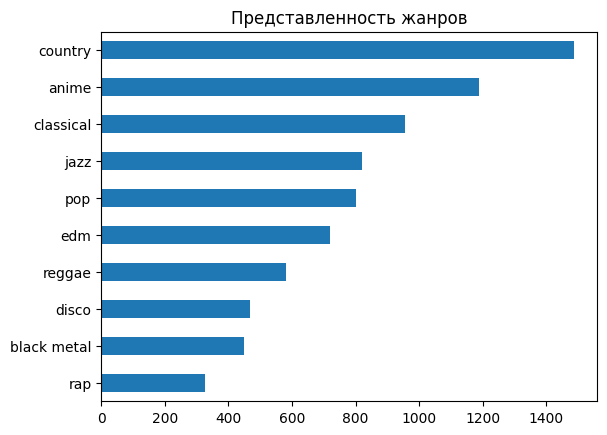

In [ ]:
df_file_paths.groupby('genre')['genre'].count().sort_values(ascending=True).plot(kind='barh', title = 'Представленность жанров')
plt.ylabel("")
df_file_paths.groupby('genre')['genre'].count().sort_values(ascending=False)

Всего 10 жанров. При этом представлены они неравномерно. Больше всего обложек жанра кантри (1486). Также много альбомов жанра аниме (1189) и классической музыки (955). Меньше всего - диско (468), black metal (450) и rap (328).

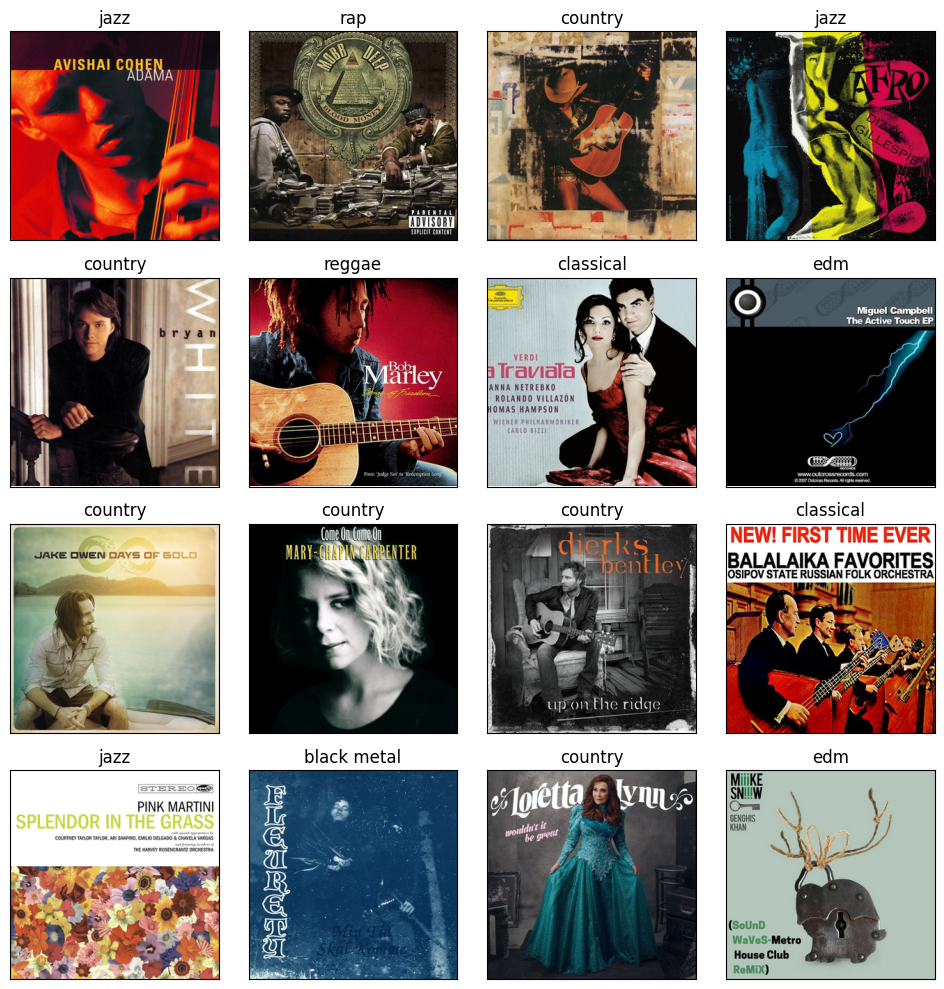

In [ ]:
fig = plt.figure(figsize=(10,10))
show_data = df_file_paths.sample(16)

for i in range(16):
    ax = fig.add_subplot(4, 4, i + 1)
    img_path = show_data['picture_address'].iloc[i]
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(str(show_data['genre'].iloc[i]), color='black')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

plt.show()

## Baseline - базовая модель

Воспользуемся предобученной моделью ResNet50, чтобы извлечь эмбеддинги изображений. Не будем использовать верхние слои сети, которые используются для классификации (параметр include_top=False).

In [ ]:
base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

def get_image_embedding_resnet50(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)

    # Получаем эмбеддинг
    resnet_feature = base_model.predict(img_data)
    return resnet_feature.flatten()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


В итоге для каждого изображения получается эмбеддинг размером 2048. Сохраним эмбеддинги в текущий датасет с адресами и жанрами изображений.

In [ ]:
%%time

df_file_paths['embedding'] = df_file_paths['picture_address'].apply(get_image_embedding_resnet50)
df_file_paths['embedding_str'] = df_file_paths['embedding'].apply(lambda x: ' '.join(map(str, x)))
df_file_paths.to_csv('/content/drive/My Drive/embeddings.csv', index=False)

Обучим модель KNN (k-Nearest Neighbours)

In [ ]:
X = np.stack(df_file_paths['embedding'].values)
y = df_file_paths['genre'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

In [ ]:
d = X_train.shape[1]  # размерность эмбеддингов
d

2048

Используем индекс IndexFlatL2 из библиотеки FAISS для поиска L2-расстояния между векторами.

In [ ]:
index = faiss.IndexFlatL2(d)
index.add(X_train)

Выполним поиск для тестовых данных X_test. Количество k ближайших соседей возьмем равным 7.

In [ ]:
k = 7

D, I = index.search(X_test, k)

Сформируем предсказания для тестового набора. Для каждого тестового изображения определим наиболее часто встречающийся класс среди его k ближайших соседей. Присвоим ему класс с наибольшим количеством голосов среди соседей.

Выведем отчет о классификации.

In [ ]:
predictions = np.array([np.argmax(np.bincount(y_train_encoded[neighbors])) for neighbors in I])

accuracy = accuracy_score(y_test_encoded, predictions)

report = classification_report(y_test_encoded, predictions, target_names=le.classes_)
print(report)

              precision    recall  f1-score   support

       anime       0.62      0.76      0.69       254
 black metal       0.75      0.73      0.74        97
   classical       0.46      0.71      0.56       191
     country       0.43      0.66      0.52       296
       disco       0.30      0.20      0.24        85
         edm       0.69      0.32      0.44       144
        jazz       0.28      0.20      0.23       158
         pop       0.41      0.20      0.27       159
         rap       0.46      0.20      0.28        56
      reggae       0.37      0.17      0.24       120

    accuracy                           0.48      1560
   macro avg       0.48      0.42      0.42      1560
weighted avg       0.48      0.48      0.46      1560



Accuracy для алгоритма KNN, построенного на эмбеддингах, составляет 0.48.

Лучше всего алгоритм справился с жанром anime и black metal, f1-score которых равен 0.69 и 0.74 соответственно. Скорее всего, это связано с тем, что эти жанры имеют четкие отличительные черты. У anime это обложки в виде рисунка или девушки-азиатки, у black metal - обложки темных цветов, мрачные, с готическими замками, чудовищами и крестами.

Хуже всего алгоритм справился с такими жанрами, как reggae, rap, pop, jazz, disco. f1-score у этих жанров колеблется от 0.23 до 0.28. Возможно, это связано с тем, что обложки этих жанров более разнообразны, один из этих жанров может быть похож на другой.

В следующем разделе рассмотрим несколько примеров обложек и их ближайших соседей по мнению алгоритма KNN. Далее построим нейронную сеть и проверим, улучшиться ли качество предсказаний жанров.

# Рекомендательная система

Рассмотрим несколько примеров обложек разных жанров. Для каждой выведем несколько наиболее похожих альбома, предложенных алгоритмом KNN.

Найдем L2-расстояния между векторами для тренировочной выборки.

In [ ]:
k = 7

D_train, I_train = index.search(X_train, k)

### Пример 1. Anime

Один из наиболее точно предсказанных жанров - anime. Рассмотрим два примера обложек этого жанра - с изображением людей, и с обложкой, прорисованной в стиле anime.

Найдем похожие на эту обложку:

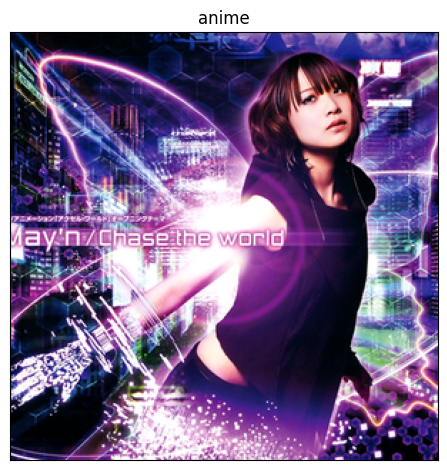

In [ ]:
img_path = df_file_paths['picture_address'].iloc[18]
img = Image.open(img_path)
plt.imshow(img)
plt.title(str(df_file_paths['genre'].iloc[18]), color='black')
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [ ]:
k_initial=-1
for element in X_train:
  k_initial+=1
  if (element == X[18]).all() == True:
    break


I_initial = []
k=-1
for i in I_train[k_initial]:
  for element in X:
    k+=1
    if (element == X_train[i]).all() == True:
      I_initial.append(k)
      k=-1
      break

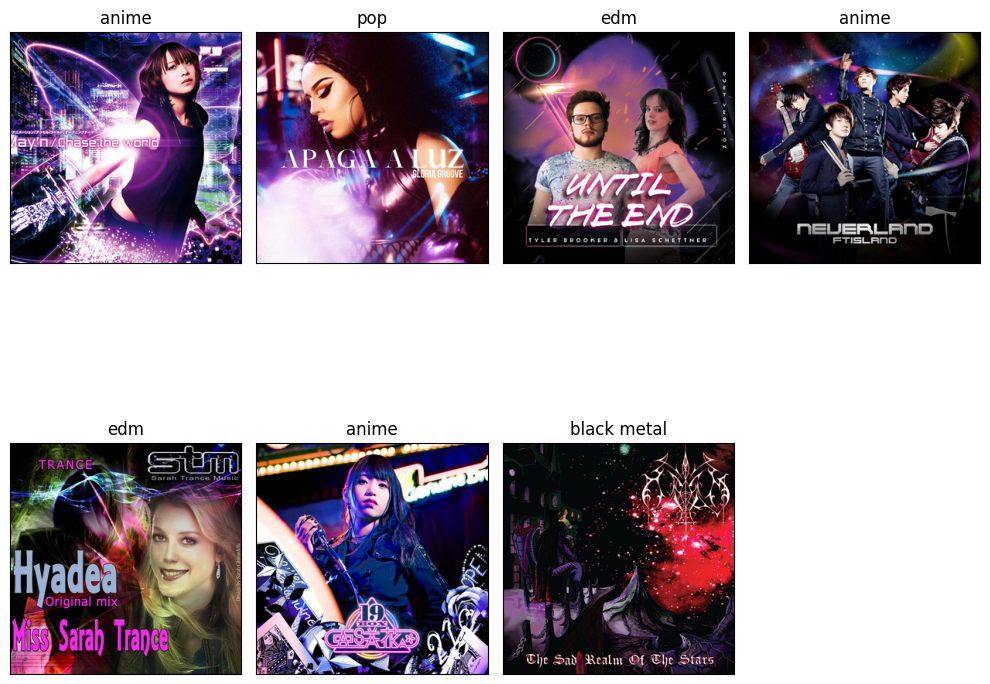

In [ ]:
fig = plt.figure(figsize=(10,10))
k=1
for i in I_initial:
    ax = fig.add_subplot(2, 4, k)
    img_path = df_file_paths['picture_address'].iloc[i]
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(str(df_file_paths['genre'].iloc[i]), color='black')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    k+=1

plt.show()

Алгоритм вывел довольно похожие обложки по визуалу - в черно-фиолетовых цветах, с изображением девушек. Не все из них принадлежат к жанру anime , по крайней мере две наиболее похожие обложки (слева направо, сверху вниз выведены обложки от наиболее похожих до наименее). Но этот жанр есть в рекомендованных, и они довольно похожи.

### Пример 2. Anime

Второй пример из жанра anime. Найдем похожие на этот альбом:

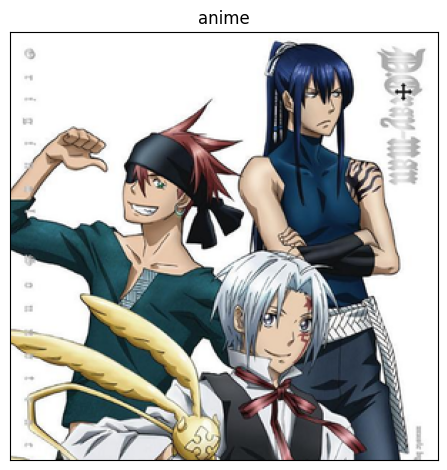

In [ ]:
img_path = df_file_paths['picture_address'].iloc[16]
img = Image.open(img_path)
plt.imshow(img)
plt.title(str(df_file_paths['genre'].iloc[16]), color='black')
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [ ]:
k_initial=-1
for element in X_train:
  k_initial+=1
  if (element == X[16]).all() == True:
    break


I_initial = []
k=-1
for i in I_train[k_initial]:
  for element in X:
    k+=1
    if (element == X_train[i]).all() == True:
      I_initial.append(k)
      k=-1
      break

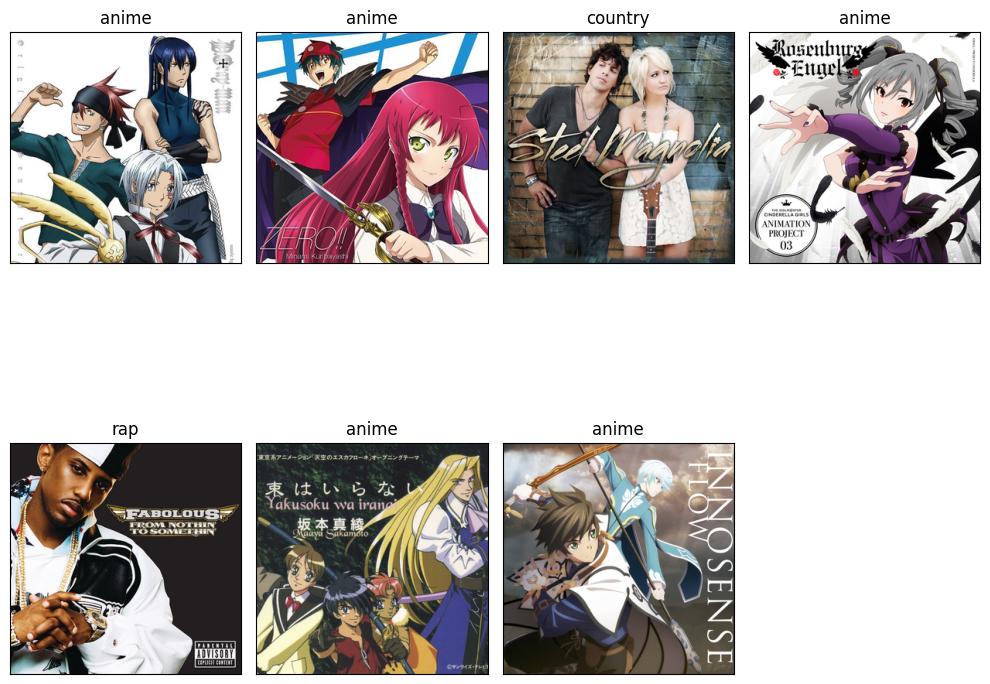

In [ ]:
fig = plt.figure(figsize=(10,10))
k=1
for i in I_initial:
    ax = fig.add_subplot(2, 4, k)
    img_path = df_file_paths['picture_address'].iloc[i]
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(str(df_file_paths['genre'].iloc[i]), color='black')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    k+=1

plt.show()

Большинство предложенных вариантов - тоже обложки в стиле фильмов anime. Но есть также мужчина и женщина в похожих на героев позах и одна обложка в стиле rap.

### Пример 3. Black metal

Наибольшее значение f1-score  - у жанра black metal. Посмотрим, какие жанры будут предложены к этому альбому:

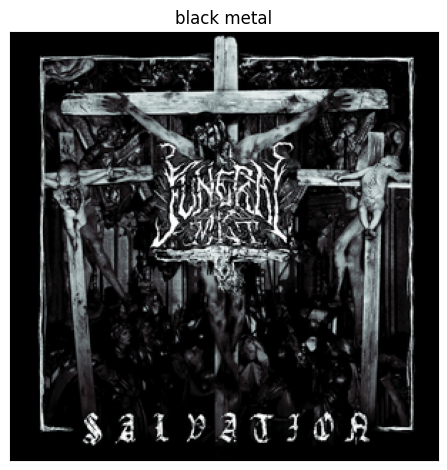

In [ ]:
img_path = df_file_paths['picture_address'].iloc[1231]
img = Image.open(img_path)
plt.imshow(img)
plt.title(str(df_file_paths['genre'].iloc[1231]), color='black')
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [ ]:
k_initial=-1
for element in X_train:
  k_initial+=1
  if (element == X[1231]).all() == True:
    break


I_initial = []
k=-1
for i in I_train[k_initial]:
  for element in X:
    k+=1
    if (element == X_train[i]).all() == True:
      I_initial.append(k)
      k=-1
      break

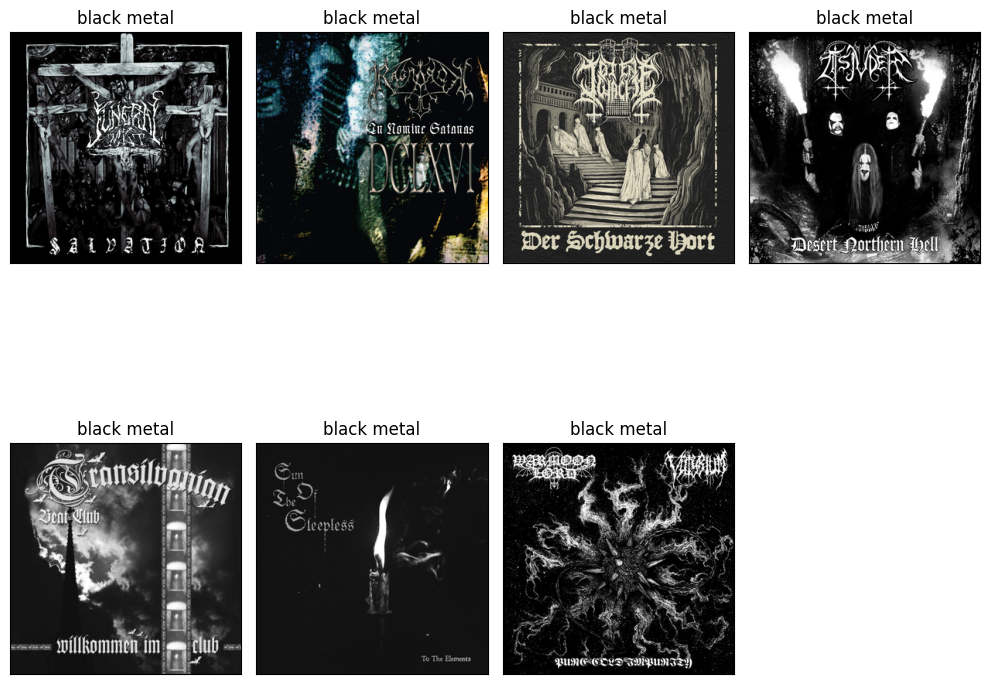

In [ ]:
fig = plt.figure(figsize=(10,10))
k=1
for i in I_initial:
    ax = fig.add_subplot(2, 4, k)
    img_path = df_file_paths['picture_address'].iloc[i]
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(str(df_file_paths['genre'].iloc[i]), color='black')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    k+=1

plt.show()

Все альбомы из предложенных относятся к такому же жанру black metal. Они все очень похожи - черный цвет, одинаковый готический шрифт.

### Пример 4. Rap

Посмотрим на жанр rap, точной прогноз которого у бейзлайн модели был одним из самых низких.

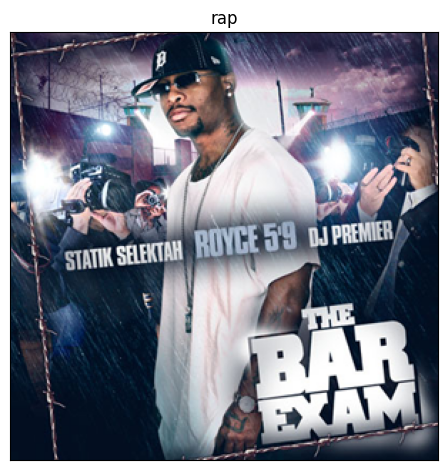

In [ ]:
img_path = df_file_paths['picture_address'].iloc[7114]
img = Image.open(img_path)
plt.imshow(img)
plt.title(str(df_file_paths['genre'].iloc[7114]), color='black')
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [ ]:
k_initial=-1
for element in X_train:
  k_initial+=1
  if (element == X[7114]).all() == True:
    break


I_initial = []
k=-1
for i in I_train[k_initial]:
  for element in X:
    k+=1
    if (element == X_train[i]).all() == True:
      I_initial.append(k)
      k=-1
      break

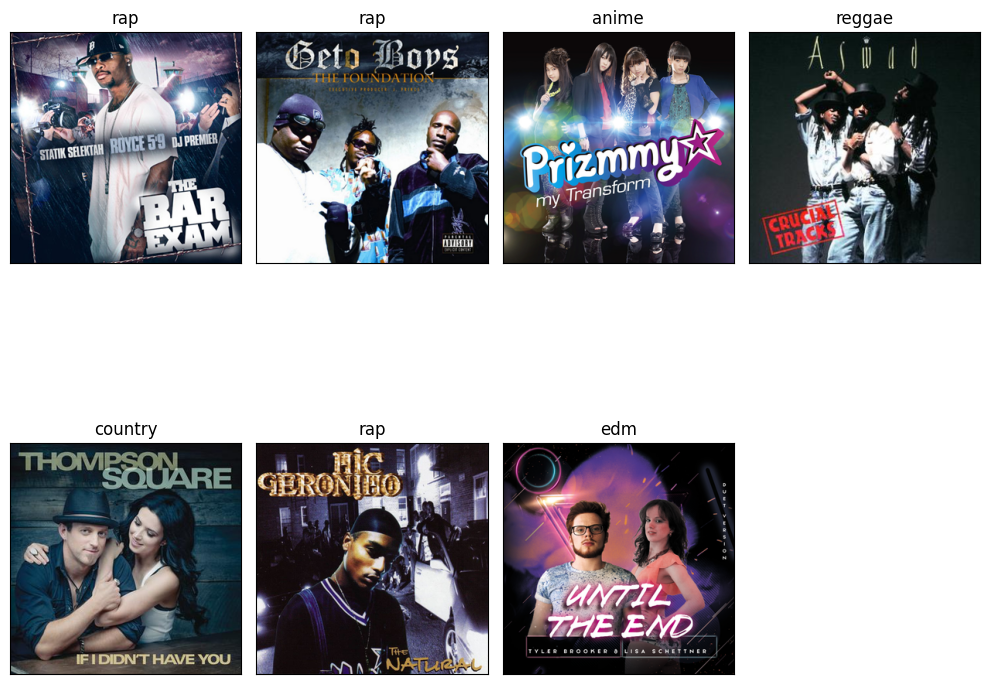

In [ ]:
fig = plt.figure(figsize=(10,10))
#show_data = df_file_paths.sample(16)
k=1
for i in I_initial:
    ax = fig.add_subplot(2, 4, k)
    img_path = df_file_paths['picture_address'].iloc[i]
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(str(df_file_paths['genre'].iloc[i]), color='black')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    k+=1

plt.show()

В рекомендациях мы видим альбомы разных жанров. Только две обложки такого же жанра - rap. Тем не менее, они довольно похожи между собой. Особенно удачен выбор самой "похожей" обложки (вторая слева), они действительно близки по цветам и изображению и принадлежат к одному жанру.

Примеры показали, что рекомендательная система, основанная на полученных эмбеддингах, довольно неплохо работает, несмотря на то, что общее значение accuracy не очень высокое - 0.48.

Видно, что она хорошо справляется с такими жанрами, как anime и black metal. Хуже - с рассмотренным жанром rap. Тем не менее, наиболее похожий на рассматриваемую обложку (самый ближайший сосед) альбом хорошо определяется моделью, визуаотно можно заметить большое сходство.

#Построение нейросети

## Построение нейросети - ResNet18, ResNet34, ResNet50, ResNet101

Рассмотрим, какие результаты показывают архитектуры ResNet18, ResNet34, ResNet50, ResNet101.

Для каждой нейросети были применены одинаковые характеристики - кол-во эпох 10, размер батча 64 (по умолчанию), learning rate 0.001, применена нормализация. Все вычисления производились с помощью библиотеки FastAI.

Загруженные веса не применялись, так как в самом начале модели показали лучшее качество, обучаясь заново.

В качестве основной метрики, которая будет оценивать результат, будет Accuracy.

Максимальные значения Accuracy были следующие:

Архитектура | Accuracy (макс.)
--- | ---
ResNet18 | 65.3
ResNet34 | 65.6
ResNet50 | 70.1
ResNet101 | 70.3

Для дальнейшей работы была выбрана архитектура ResNet50, так как она показала хорошие результаты. Более сложная ResNet101 показала результат лишь немного лучше, чем ResNet50. Из-за сложности вычислений не будем далее ее применять.

## Размер батча

Для модели ResNet50 было увеличено количество эпох до 20, так как функция потерь не уменьшалась так же стремительно, как в более "простых" моделях ResNet18 и ResNet34, и важно было проследить, что модель обучилась и как ведут себя метрики в процессе обучения.

Далее менялся размер батча - увеличен до 90 и уменьшен до 50. Результаты:

Размер батча | Accuracy (макс.)
--- | ---
64 (по умолчанию) | 70.1
90 | 71.4
50 | 71.5


Лучший результат показал размер батча 50. Он ненамного лучше, чем размер в 90 картинок, но из-за сложности вычислений оставим размер батча, равным 50.

## learning rate - скорость обучения

Ранее скорость обучения (learning rate) стояла по умолчанию и была равна 0.001.

Проверим, изменится ли результат, если сделать learning rate, равным 0.01. Другие параметры оставим такими же - архитектура ResNet50 без предобученных весов, размер батча 50, 20 эпох обучения.

lr | Accuracy (макс.)
--- | ---
0.001 (по умолчанию) | 71.5
0.01 | 72.2


Увеличение скорости обучения дало прирост качества прогноза, воспользуемся значением 0.01 далее.

## Аугментация

Качество предсказания выделенных жанров неравномерно - какие-то жанры определяются лучше, какие-то хуже. Возможно, применение аугметации сможет частично решить эту проблему, так как у нейросети появится больше разнообразных данных для обучения.

Аугментация | Accuracy (макс.)
--- | ---
Нет | 72.2
Есть | 73.0

Использование аугментации улучшило качество прогноза.

Построим итоговую модель с учетом удачных преобразований модели.

# Итоговая модель

Построим итоговую модель со следующими характеристиками:

архитектура ResNet50 без предобученных весов,

размер батча 50,

20 эпох обучения,

learning rate 0.01,

применена аугментация,

размер тестовой выборки 20%

In [ ]:
path = '/content/drive/MyDrive/Music_CV/'

In [ ]:
dls = ImageDataLoaders.from_folder(path, valid_pct=0.2, seed=12345, bs=50, batch_tfms=aug_transforms(flip_vert=True))

In [ ]:
dls.valid_ds.items[:3]

[Path('/content/drive/MyDrive/Music_CV/pop/894d25fb-ed97-4f87-8190-d30ae26ddcd0.png'),
 Path('/content/drive/MyDrive/Music_CV/pop/9a08c8ed-4fc1-440a-a0ef-f635635a06a0.png'),
 Path('/content/drive/MyDrive/Music_CV/jazz/40e3e022-f4b7-441d-b1d3-2873a89ffc25.png')]

In [ ]:
len(dls.valid_ds)

1560

In [ ]:
len(dls.train_ds)

6240

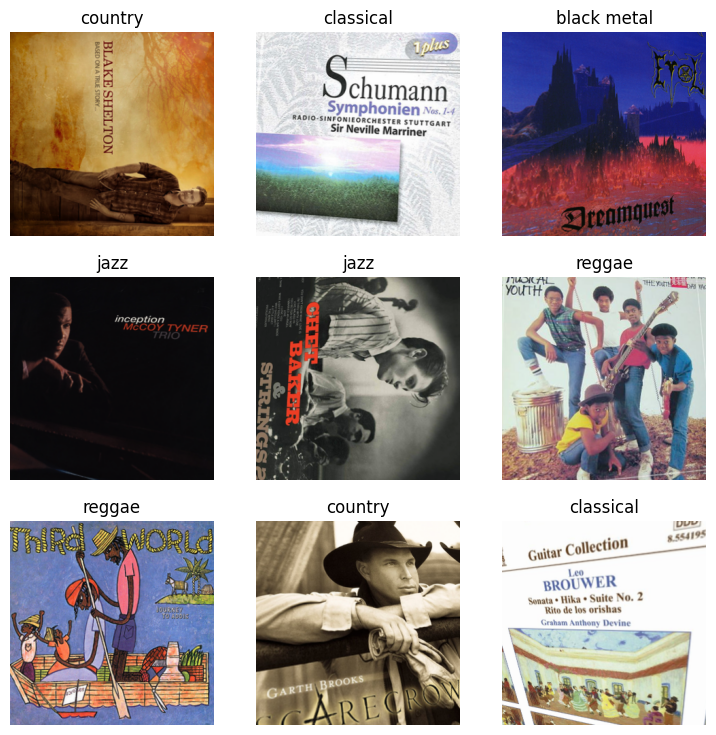

In [ ]:
dls.show_batch()

In [ ]:
ResNet50_CV = vision_learner(dls, models.resnet50, normalize=True, \
                             lr=0.01,
                             metrics=[accuracy, Precision(average='weighted'), Recall(average='weighted'), F1Score(average='weighted')]
)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 184MB/s]


In [ ]:
ResNet50_CV.fine_tune(20)

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.992021,1.285886,0.626923,0.622102,0.626923,0.619995,54:08


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.301227,1.081641,0.687180,0.685755,0.687179,0.681056,02:12
1,1.097783,1.016961,0.700000,0.699636,0.700000,0.696236,02:10
2,0.965390,0.971244,0.713462,0.710406,0.713462,0.707340,02:11
3,0.851394,0.970359,0.708974,0.713065,0.708974,0.708297,02:11
4,0.715967,0.984069,0.716026,0.716193,0.716026,0.711240,02:11
5,0.617112,0.996981,0.714103,0.715512,0.714103,0.711529,02:13
6,0.491340,0.960602,0.716026,0.714740,0.716026,0.713863,02:11
7,0.439873,1.014231,0.715385,0.715955,0.715385,0.712839,02:11
8,0.348539,1.020076,0.733333,0.731404,0.733333,0.731098,02:11
9,0.291471,1.090292,0.714103,0.710792,0.714103,0.710579,02:11


Максимальное значение Accuracy достигает 73%. При этом фнкция потерь на тренировочной выборке постоянно уменьшается. На тестовой - сначала уменьшается, потом начинает увеличиваться, что указывает на то, что модель начинает переобучаться.

Построим матрицу ошибок (нормализованную) и посмотрим, какие жанры определяются хуже или лучше.

In [ ]:
interp50 = ClassificationInterpretation.from_learner(ResNet50_CV)

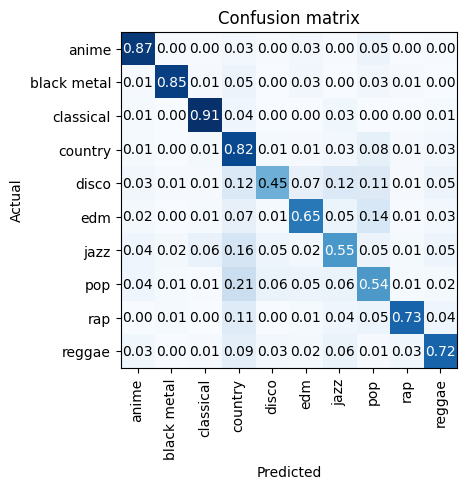

In [ ]:
interp50.plot_confusion_matrix(normalize=True)

Наиболее точно модель определяет жанры anime, black metal, classical, country, rap.

Хуже всего - disco, pop, edm, jazz, reggae.

При этом жанр country ошибочно присваивается многим другим жанрам.

In [ ]:
preds, target, losses = ResNet50_CV.get_preds(with_loss=True)

Выведем несколько случайных примеров и посмотрим, правильно ли они предсказались.

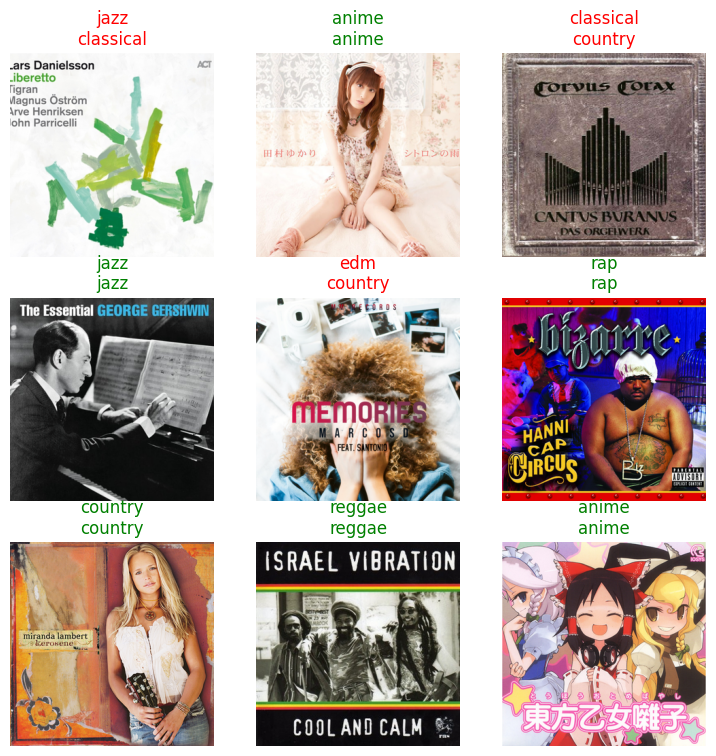

In [ ]:
ResNet50_CV.show_results()

В примере выше есть два примера с неправильным предсказанием. Это первая обложка, которая относится к жанру классической музыки, но нейросеть определила ее как джаз. Возможно, из-за необычного рисунка мазками на обложке, который менее характерен для альбомов классической музыки.

И второй пример - альбом исполнителя, который исполняет музыку в стиле black metal. Но модель определила его как classic. Скорее всего это произошло из-за того, что на обложке нарисован орган и она действительно похожа на альбом классической музыки.

Посмотрим больше примеров, где модель ошибается. Выведем топ-5 самых ошибочных примеров.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


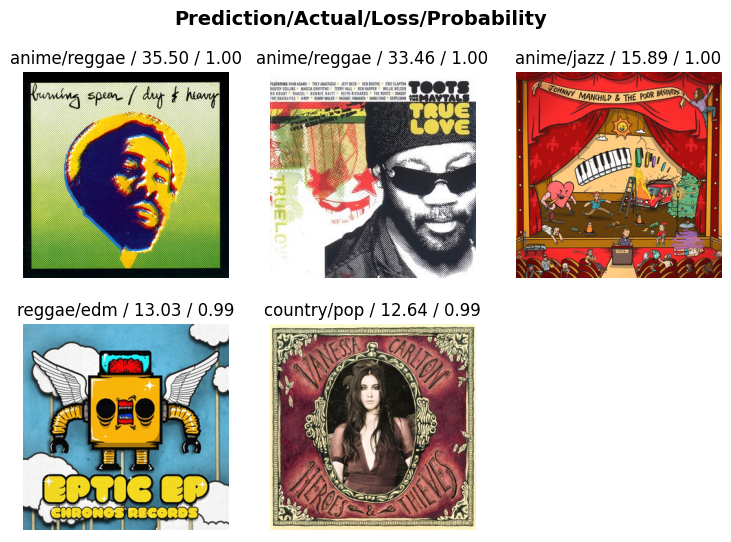

In [ ]:
interp50.plot_top_losses(5)

Пятая обложка в самом низу - мужчина обнимает гитару. Nelson Sargento  - латиноамериканский исполнитель, его альбом в нашей базе данных обозначен как джаз. Модель определила его как кантри направление. Скорее всего, это произошло из-за изображения человека классической гитары на обложке.

Четвертая обложка - исполнительницы поп-музыки Vanessa Carlton. Модель определила этот альбом как кантри-музыку. Скорее всего, это произошло из-за несвойственного поп-альбомам обрамления на обложке в виде узоров и закруглений.

Самая правая обложка в первом ряду определилась нейросетью как жанр аниме, но на самом деле женщина на обложке исполняет музыку в стиле регги.

Первые две обложки в первом ряду тоже относятся к стилю регги, хотя модель определила жанры pop и edm.

# Итоги

Всего у нас есть 7800 изображений обложек 10 музыкальных жанров.

Сначала была построена бейзлайн модель, основанная на эмбеддингах. Далее применены нейронные сети.

Для определения принадлежности к музыкальному жанру были расммотрены архитектуры нейросетей ResNet18, ResNet34, ResNet50, ResNet101. Оптимальной по соотношению трудоемкости вычислений и качеству была выбрана ResNet50. Итоговая модель вычислялась по следующим характеристикам:

архитектура ResNet50 без предобученных весов,

размер батча 50,

20 эпох обучения,

learning rate 0.01,

применена аугментация,

размер тестовой выборки 20%


Итоговое качество модели получилось (Accuracy) почти 73%.


Наиболее точно модель определяет жанры anime, black metal, classical, country, rap.

Хуже всего - disco, pop, edm, jazz, reggae.

При этом жанр country ошибочно присваивается многим другим жанрам.

Для более точного предсказания, возможно, следует добавить дополнительную информацию - анализ текста на обложке и на обратной стороне обложки.

Некоторые неправильно предсказанные обложки трудно определяются человеком - артист может исполнять музыку одного жанра, а обложка более характерна для другого (например, фото органа и других классических инструментов на обложках других жанров "путает" модель, да и человеку, без знания исполнителя трудно догадаться о действительном жанре альбома).

Поэтому, если исполнители хотят, чтобы обложки их альбомов хорошо распознавались автоматическими системам, им следует ознакомится с уже существующими обложками определенных жанров, и делать свою обложку с похожими элементами, не внося элементы других жанров.

Полученная нейросеть улучшила accuracy базовой модели на 25 процентных пункта. Это значительный результат, значит построение нейронной сети в данном случае оправданно.

Несмотря на более низкое качество базовой модели, ее можно использовать для выдачи рекомендаций пользователям, которые интересуются определенным альбомом. Алгоритм KNN, построенный на полученных эмбеддингах, вполне успешно ищет "похожие" альбомы.